# *Multi-depth hologram generation using ADAM algorithm*
**Author:** Gawoon Ban | **Last Updated:** 2025-03-20

Implementing `multi-plane hologram` generation using a `multi-loss approach`.   
In this code, We assume `complex SLM` that can control both amplitude and phase.

In [1]:
cd ../..

c:\Users\yilin\pado


---

## **Method 1**
First method is to optimize using `amplitude` only, not complex field.This tutorial consists of implementing `SLM optimizer` and applying example.

## 🌊 **Step 1: Import Pado**
First, you should import `Pado`. Make sure to install all the dependency.

In [2]:
from typing import List
from pado.light import Light
from pado.propagator import Propagator
from pado.math import calculate_psnr, cm, nm, um   # Use units of cm, nm, and um for readability.
import torch
import torch.optim as optim
import torch.nn as nn
import pado

## ⚙️ **Step 2: Default value setting**
Sets the values of the variables used in the code. You can change the values in this part to suit your situation.

In [3]:
R = 2000  # number of rows
C = 2000  # number of columns
pitch = 7.2*um  # physical size of each pixel in [m]
wvl = [660*nm, 521*nm, 445*nm] # wavelength of the light in [m]
dim = (1, 3, R, C)  # dimension of the light [batch, channel, row, column]
device = 'cuda' if torch.cuda.is_available() else 'cpu'

# By default, we use the ASM method. 
# If you want to use a different propagate method, you can choose the option of Fraunhofer, Fresnel, FFT (Fast Fourier Transform), ASM, and RS.
prop = pado.propagator.Propagator('ASM') 

d1 = 50 * cm # distance from the CGH plane to the first image plane
d2 = 60 * cm # distance from the CGH plane to the second image plane

## ⛩️ **Step 3: Build SLM field optimizer**
Optimizing `multi-depth` plane SLM field with `ASM` propagation and `ADAM` optimizer.   
Only `Amplitude` is used for optimization.

In [5]:
def optimize_multi_plane_adam(init_light: Light, target_lights: List[Light], 
                            distances: List[float], weights: List[float] = None,
                            n_iter: int = 100, prop_model: str = 'ASM',
                            lr: float = 0.01) -> Light:
    """Performs simultaneous optimization for multiple planes using ADAM optimizer.

    Args: 
        init_light (Light): Complex field to start optimization
        target_lights (List[Light]): Light field list we want to target
        distances (List[float]): Propagate distances to each target planes
        weights (List[float]): Loss weight for each plane
        n_iter (int=100): Number of optimization iterations
        prop_model (str='ASM): Propagation model (we use ASM)
        Lr (float=0.01): Learning rate
    """
    if weights is None:
        weights = [1.0/len(target_lights)] * len(target_lights) # If there is no weight, impose the same weight on all planes
        
    slm_field = init_light.clone()
    prop = Propagator(prop_model)
    
    # Optimize by separating complex field into real and imaginary parts
    field_real = torch.nn.Parameter(slm_field.get_field().real.clone(), requires_grad=True)
    field_imag = torch.nn.Parameter(slm_field.get_field().imag.clone(), requires_grad=True)
    
    # Setup ADAM optimizer
    optimizer = optim.Adam([field_real, field_imag], lr=lr)
    loss_fn = nn.MSELoss() # We use MSE Loss function
    
    # Pre-calculate target amplitudes
    target_amps = [target.get_amplitude().detach() for target in target_lights]

    for i in range(n_iter):
        optimizer.zero_grad()
        total_loss = 0
        
        # Reconstruct current complex field by combining real and imaginary parts
        current_field = torch.complex(field_real, field_imag)
        slm_field.field = current_field
        
        # Calculate loss at each plane
        for target_amp, z, w in zip(target_amps, distances, weights):
            recon_field = prop.forward(slm_field, -z)
            recon_amp = recon_field.get_amplitude()
            loss = w * loss_fn(recon_amp, target_amp)   # We use amplitude to optimize
            total_loss += loss
            
        # Backpropagation and optimization step
        total_loss.backward()
        optimizer.step()
        
        # Apply SLM constraints (amplitude=1)
        with torch.no_grad():
            current_field = torch.complex(field_real, field_imag)
            phase = torch.angle(current_field)
            field_real.data = torch.cos(phase)
            field_imag.data = torch.sin(phase)
        
        # Print progress
        if i % 10 == 0:
            psnr = sum(w * calculate_psnr(prop.forward(slm_field, -z).get_intensity(), target.get_intensity())
                      for w, z, target in zip(weights, distances, target_lights))
            print(f"Iteration {i}, Loss: {total_loss.item():.4f}, Average PSNR: {psnr:.2f}")
            # We try to get high psnr value.
    
    # Set final field
    final_field = torch.complex(field_real.data, field_imag.data)
    slm_field.field = final_field
    return slm_field

## 🖥️ **Step 4 : Set initial SLM**
Creates an `initial SLM` for optimization.

In [6]:
init_slm = pado.light.Light(dim, pitch, wvl, device=device)
init_slm.set_amplitude_ones()
init_slm.set_phase_random()

## 🎯 **Step 5 : Set target images and distances**
Set `target images` that we want to optimize and propagate distance.

In [7]:
first_plane = pado.light.Light(dim,pitch,wvl,device=device)
first_plane.load_image(image_path=r'example\asset\PADO_letter.PNG', random_phase=True) # load an image with random phase

second_plane = pado.light.Light(dim,pitch,wvl,device=device)
second_plane.load_image(image_path=r'example\asset\PADO_logo.png', random_phase=True)

combine_image = pado.light.Light(dim,pitch,wvl,device=device)
combine_image.set_field(first_plane.get_field() + second_plane.get_field()) # In this way, you can combine 2 light fields

target_lights = [first_plane, second_plane] # You can optimize the slm of the desired image by changing this value.
distances = [d1, d2]  # 50cm, 60cm
weights = [0.5, 0.5]  # Equal weights

## 📈 **Step 6 : Perform SLM optimization**
Run `ADAM` optimizer for SLM optimization using `optimize_multi_plane_adam`.

In [8]:
optimized_field = optimize_multi_plane_adam(
    init_slm, 
    target_lights, 
    distances, 
    weights, 
    n_iter=200,
    lr=0.2
)

Iteration 0, Loss: 0.2076, Average PSNR: 9.77
Iteration 10, Loss: 0.0552, Average PSNR: 15.49
Iteration 20, Loss: 0.0382, Average PSNR: 15.98
Iteration 30, Loss: 0.0326, Average PSNR: 16.11
Iteration 40, Loss: 0.0298, Average PSNR: 16.28
Iteration 50, Loss: 0.0281, Average PSNR: 16.39
Iteration 60, Loss: 0.0269, Average PSNR: 16.50
Iteration 70, Loss: 0.0260, Average PSNR: 16.60
Iteration 80, Loss: 0.0253, Average PSNR: 16.70
Iteration 90, Loss: 0.0247, Average PSNR: 16.79
Iteration 100, Loss: 0.0241, Average PSNR: 16.87
Iteration 110, Loss: 0.0236, Average PSNR: 16.96
Iteration 120, Loss: 0.0232, Average PSNR: 17.03
Iteration 130, Loss: 0.0228, Average PSNR: 17.11
Iteration 140, Loss: 0.0224, Average PSNR: 17.17
Iteration 150, Loss: 0.0220, Average PSNR: 17.24
Iteration 160, Loss: 0.0217, Average PSNR: 17.30
Iteration 170, Loss: 0.0214, Average PSNR: 17.36
Iteration 180, Loss: 0.0211, Average PSNR: 17.41
Iteration 190, Loss: 0.0209, Average PSNR: 17.46


## 🔍 **Step 7 : Visualize and evaluate results**
Show optimized fields and evaluate the results with the psnr score.


Optimized CGH pattern:


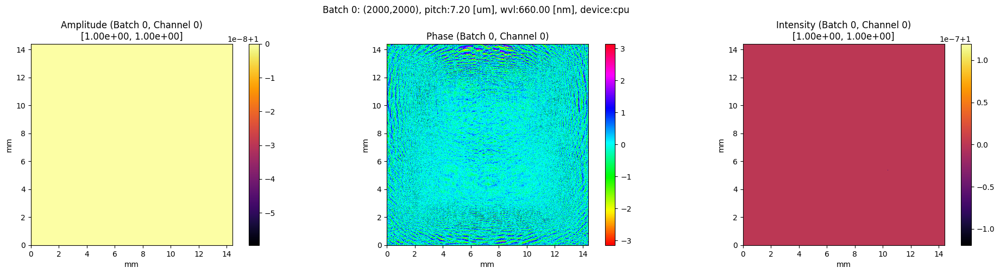


Reconstruction at first plane (d1 = 50cm):


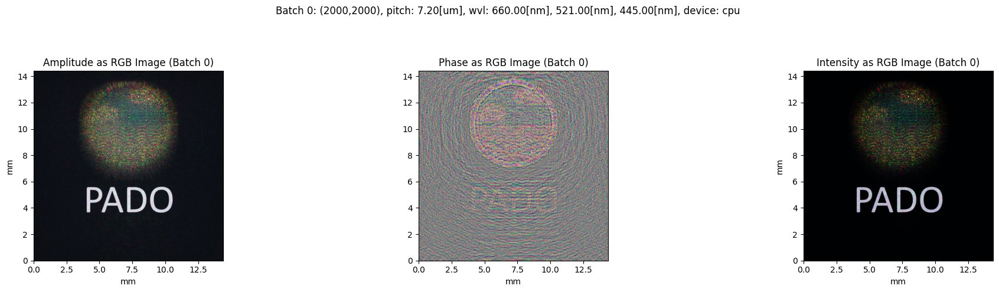


Reconstruction at second plane (d2 = 60cm):


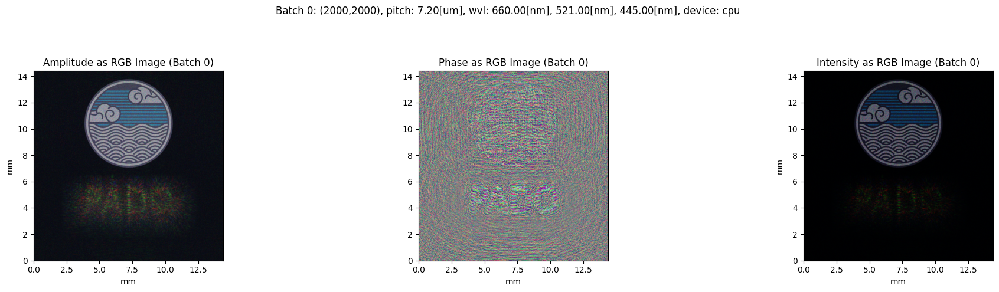


Final PSNR at 50cm: 19.95
Final PSNR at 60cm: 15.71


In [9]:
print("\nOptimized CGH pattern:")
optimized_field.visualize(c=0)

print("\nReconstruction at first plane (d1 = 50cm):")
recon_d1 = prop.forward(optimized_field, -d1)
recon_d1.adjust_amplitude_to_other_light(combine_image)
recon_d1.visualize_image()

print("\nReconstruction at second plane (d2 = 60cm):")
recon_d2 = prop.forward(optimized_field, -d2)
recon_d2.adjust_amplitude_to_other_light(combine_image)
recon_d2.visualize_image()

# Calculate and print PSNR
psnr_d1 = calculate_psnr(recon_d1.get_intensity(), first_plane.get_intensity())
psnr_d2 = calculate_psnr(recon_d2.get_intensity(), second_plane.get_intensity())
print(f"\nFinal PSNR at 50cm: {psnr_d1:.2f}")
print(f"Final PSNR at 60cm: {psnr_d2:.2f}")

---

## **Method 2**
Second method is to optimize using `complex loss`. This tutorial consists of implementing `SLM optimizer` and applying example.

In [10]:
# Method2 and example inspired by:
# Chun Chen, Byounghyo Lee, Nan-Nan Li, Minseok Chae, Di Wang, Qiong-Hua Wang, and Byoungho Lee,
# "Multi-depth hologram generation using stochastic gradient descent algorithm with complex loss function,"
# Opt. Express 29, 15089-15103 (2021)

## 🌊 **Step 1: Import Pado**
First, you should import `Pado`. Make sure to install all the dependency.

In [11]:
from typing import List
from pado.light import Light
from pado.propagator import Propagator
from pado.math import calculate_psnr, cm, nm, um   # Use units of cm, nm, and um for readability.
import torch
import torch.optim as optim
import torch.nn as nn
import pado

## ⚙️ **Step 2: Default value setting**
Sets the values of the variables used in the code. You can change the values in this part to suit your situation.

In [15]:
R = 2000  # number of rows
C = 2000  # number of columns
pitch = 7.2*um  # physical size of each pixel in [m]
wvl = [660*nm, 521*nm, 445*nm] # wavelength of the light in [m]
dim = (1, 3, R, C)  # dimension of the light [batch, channel, row, column]
device = 'cuda' if torch.cuda.is_available() else 'cpu'

# By default, we use the ASM method. 
# If you want to use a different propagate method, you can choose the option of Fraunhofer, Fresnel, FFT (Fast Fourier Transform), ASM, and RS.
prop = pado.propagator.Propagator('ASM') 

d1 = 50 * cm # distance from the CGH plane to the first image plane
d2 = 60 * cm # distance from the CGH plane to the second image plane

## ⛩️ **Step 3: Build SLM field optimizer**
Optimizing `multi-depth` plane SLM field with `ASM` propagation and `ADAM` optimizer.   
Use `complex loss` for optimization.

In [8]:
from typing import List
from pado.light import Light
from pado.propagator import Propagator
from pado.math import calculate_psnr, cm, nm, um
import torch
import torch.optim as optim
import torch.nn as nn

def optimize_multi_plane_complex_loss(
    init_light: Light,             
    target_lights: List[Light],     
    distances: List[float],         
    threshold: float = 0.05,    
    beta: float = 0.1,             
    n_iter: int = 200,              
    prop_model: str = 'ASM',       
    lr: float = 0.1,               
    device: str = 'cuda' if torch.cuda.is_available() else 'cpu',
    weight: float = 2.0,
    patience: int = 20  # Number of iterations to wait for PSNR improvement before early stopping
) -> Light:
    """Performs multi-plane hologram optimization using an enhanced complex loss function.

    Args:
        init_light (Light): Initial complex field for optimization (SLM field)
        target_lights (List[Light]): Target light fields at different planes
        distances (List[float]): Propagation distances to each target plane
        threshold (float=0.05): Threshold for signal/background mask generation
        beta (float=0.1): Initial weight for background loss
        n_iter (int=200): Number of optimization iterations
        prop_model (str='ASM'): Propagation model (default: Angular Spectrum Method)
        lr (float=0.1): Initial learning rate for Adam optimizer
        device (str): Device to run optimization ('cuda' or 'cpu')
        weight (float=2.0): Weight for intensity loss
        patience (int=20): Number of iterations to wait for PSNR improvement before early stopping

    Returns:
        Light: Optimized complex SLM field with the highest PSNR
    """
    # Initialize SLM field and propagation model
    slm_field = init_light.clone()
    prop = Propagator(mode=prop_model)

    # Normalize initial amplitude
    target_avg_intensity = sum(torch.mean(target.get_intensity()) for target in target_lights) / len(target_lights)
    init_avg_intensity = torch.mean(slm_field.get_intensity())
    if init_avg_intensity > 0:
        scale_factor = torch.sqrt(target_avg_intensity / init_avg_intensity)
        slm_field.set_amplitude(slm_field.get_amplitude() * scale_factor)

    # Move field tensor to the specified device
    field_tensor = slm_field.get_field().to(device)
    slm_field.set_field(field_tensor)

    # Separate complex field into real and imaginary parts for optimization
    field_real = torch.nn.Parameter(field_tensor.real.clone(), requires_grad=True)
    field_imag = torch.nn.Parameter(field_tensor.imag.clone(), requires_grad=True)

    # Set up Adam optimizer and learning rate scheduler
    optimizer = optim.Adam([field_real, field_imag], lr=lr)
    scheduler = optim.lr_scheduler.StepLR(optimizer, step_size=n_iter//3, gamma=0.1)
    loss_fn = nn.MSELoss()  # Use Mean Squared Error (MSE) as the loss function

    # Pre-calculate target fields and masks
    target_fields = [target.get_field().to(device).detach() for target in target_lights]
    target_intensities = [target.get_intensity().to(device).detach() for target in target_lights]
    masks = []
    for target_field in target_fields:
        amplitude = torch.abs(target_field)
        mask = (amplitude > threshold).float()  # 1: signal, 0: background
        masks.append(mask)

    # Track the best PSNR and corresponding field
    best_psnr = -float('inf')
    best_field = None
    patience_counter = 0

    # Optimization loop
    for i in range(n_iter):
        # Clear gradients
        optimizer.zero_grad()
        total_loss = 0

        # Gradually reduce the background loss weight as iterations progress
        current_beta = beta * (1 - i / n_iter)

        # Reconstruct current complex field
        current_field = torch.complex(field_real, field_imag)
        slm_field.set_field(current_field)

        # Calculate loss for each plane
        for target_field, target_intensity, mask, z in zip(target_fields, target_intensities, masks, distances):
            # Propagate to target plane
            recon_field = prop.forward(slm_field, z=-z, band_limit=True)
            recon_complex = recon_field.get_field()  # Reconstructed complex field
            recon_intensity = recon_field.get_intensity()  # Reconstructed intensity

            # Compute complex loss for signal area
            recon_real = recon_complex.real
            recon_imag = recon_complex.imag
            target_real = target_field.real
            target_imag = target_field.imag

            signal_loss_real = loss_fn(recon_real * mask, target_real * mask)
            signal_loss_imag = loss_fn(recon_imag * mask, target_imag * mask)
            signal_loss = signal_loss_real + signal_loss_imag

            # Compute intensity loss for signal area
            intensity_loss = loss_fn(recon_intensity * mask, target_intensity * mask)

            # Compute background loss
            recon_amp = recon_field.get_amplitude()
            target_amp = torch.abs(target_field)
            background_loss = current_beta * loss_fn(recon_amp * (1 - mask), target_amp * (1 - mask))

            # Compute total plane loss
            plane_loss = signal_loss + weight * intensity_loss + background_loss
            total_loss += plane_loss

        # Backpropagation and optimization step
        total_loss.backward()
        optimizer.step()
        scheduler.step()

        # Calculate average PSNR for all target planes
        psnrs = [calculate_psnr(prop.forward(slm_field, z=-z, band_limit=True).get_intensity(), target.get_intensity())
                 for z, target in zip(distances, target_lights)]
        avg_psnr = sum(psnrs) / len(distances)

        # Update best PSNR and field if current PSNR is higher
        if avg_psnr > best_psnr:
            best_psnr = avg_psnr
            best_field = slm_field.clone()  # Clone the current field
            patience_counter = 0  # Reset patience counter
        else:
            patience_counter += 1  # Increment patience counter if no improvement

        # Print progress
        if i % 10 == 0:
            print(f"Iteration {i}, Loss: {total_loss.item():.4f}, Average PSNR: {avg_psnr:.2f}, Best PSNR: {best_psnr:.2f}")

        # Early stopping if PSNR doesn't improve
        if patience_counter >= patience:
            print(f"Early stopping at iteration {i} with best PSNR: {best_psnr:.2f}")
            break

    # Return the field with the highest PSNR
    if best_field is not None:
        best_field.set_field(best_field.get_field().detach())
        return best_field
    else:
        # Fallback to final field if no improvement was tracked (unlikely with proper initialization)
        final_field = torch.complex(field_real.data, field_imag.data)
        slm_field.set_field(final_field)
        return slm_field

## 🖥️ **Step 4 : Set initial SLM**
Creates an `initial SLM` for optimization.

In [17]:
init_slm = pado.light.Light(dim, pitch, wvl, device=device)
init_slm.set_amplitude_ones()
init_slm.set_phase_random()

## 🎯 **Step 5 : Set target images and distances**
Set `target images` that we want to optimize and propagate distances.

In [18]:
first_plane = pado.light.Light(dim,pitch,wvl,device=device)
first_plane.load_image(image_path=r'example\asset\PADO_letter.PNG', random_phase=True) # load an image with random phase

second_plane = pado.light.Light(dim,pitch,wvl,device=device)
second_plane.load_image(image_path=r'example\asset\PADO_logo.png', random_phase=True)

combine_image = pado.light.Light(dim,pitch,wvl,device=device)
combine_image.set_field(first_plane.get_field() + second_plane.get_field()) # In this way, you can combine 2 light fields

target_lights = [first_plane, second_plane] # You can optimize the slm of the desired image by changing this value.
distances = [d1, d2]  # 50cm, 60cm
weights = [0.5, 0.5]  # Equal weights

## 📈 **Step 6 : Perform SLM optimization**
Run `ADAM` optimizer for SLM optimization using `optimize_multi_plane_complex_loss`.

In [19]:
optimized_field = optimize_multi_plane_complex_loss(
    init_light=init_slm,
    target_lights=target_lights,
    distances=distances,
    threshold=0.05,
    beta=0.1,
    n_iter=200, 
    lr=0.2,
    device=device,
    weight=2.0
)

Iteration 0, Loss: 0.2881, Average PSNR: 14.28, Best PSNR: 14.28
Iteration 10, Loss: 0.1734, Average PSNR: 15.63, Best PSNR: 15.65
Iteration 20, Loss: 0.1504, Average PSNR: 16.13, Best PSNR: 16.13
Iteration 30, Loss: 0.1380, Average PSNR: 16.70, Best PSNR: 16.70
Iteration 40, Loss: 0.1301, Average PSNR: 17.12, Best PSNR: 17.12
Iteration 50, Loss: 0.1246, Average PSNR: 17.43, Best PSNR: 17.43
Iteration 60, Loss: 0.1205, Average PSNR: 17.66, Best PSNR: 17.66
Iteration 70, Loss: 0.1182, Average PSNR: 17.79, Best PSNR: 17.79
Iteration 80, Loss: 0.1174, Average PSNR: 17.80, Best PSNR: 17.80
Iteration 90, Loss: 0.1167, Average PSNR: 17.81, Best PSNR: 17.81
Iteration 100, Loss: 0.1159, Average PSNR: 17.82, Best PSNR: 17.82
Iteration 110, Loss: 0.1152, Average PSNR: 17.81, Best PSNR: 17.82
Early stopping at iteration 119 with best PSNR: 17.82


## 🔍 **Step 7 : Visualize and evaluate results**
Show optimized fields and evaluate the results with the psnr score.


Optimized CGH pattern:


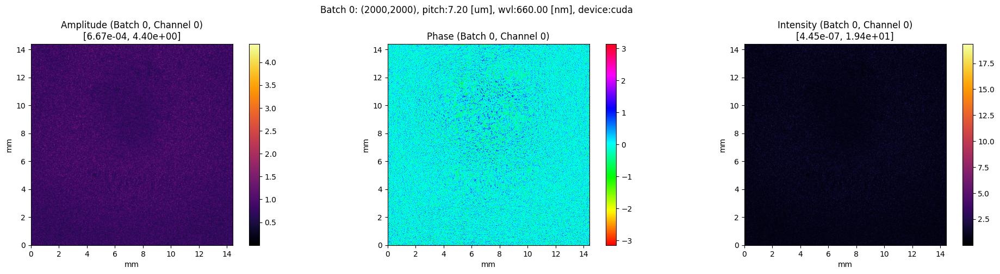


Reconstruction at first plane (d1 = 50cm):


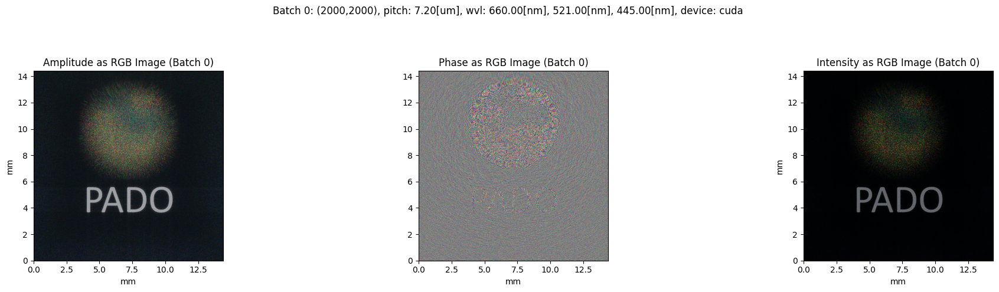


Reconstruction at second plane (d2 = 60cm):


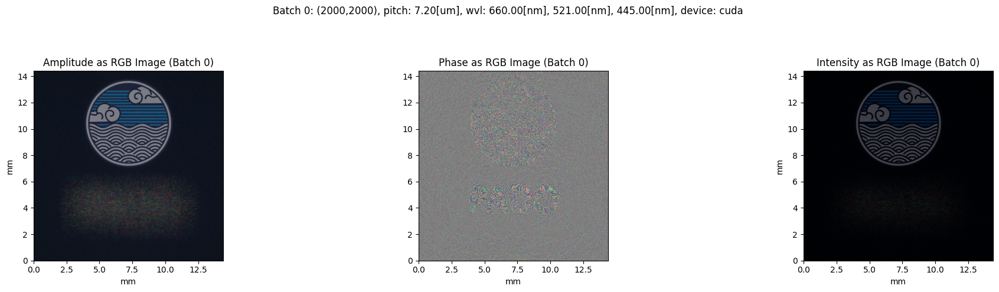


Final PSNR at 50cm: 18.95
Final PSNR at 60cm: 14.16


In [20]:
print("\nOptimized CGH pattern:")
optimized_field.visualize(c=0)

print("\nReconstruction at first plane (d1 = 50cm):")
recon_d1 = prop.forward(optimized_field, -d1)
recon_d1.adjust_amplitude_to_other_light(combine_image)
recon_d1.visualize_image()

print("\nReconstruction at second plane (d2 = 60cm):")
recon_d2 = prop.forward(optimized_field, -d2)
recon_d2.adjust_amplitude_to_other_light(combine_image)
recon_d2.visualize_image()

# Calculate and print PSNR
psnr_d1 = calculate_psnr(recon_d1.get_intensity(), first_plane.get_intensity())
psnr_d2 = calculate_psnr(recon_d2.get_intensity(), second_plane.get_intensity())
print(f"\nFinal PSNR at 50cm: {psnr_d1:.2f}")
print(f"Final PSNR at 60cm: {psnr_d2:.2f}")

---

## **Example**
Using A, B, C, and D pictures with `four different depths` as target images, optimize slm using the above `optimization_multi_plane_complex_loss` function.   `

## 🌊 **Step 1: Import Pado**
First, you should import `Pado`. Make sure to install all the dependency.

In [3]:
from typing import List
from pado.light import Light
from pado.propagator import Propagator
from pado.math import calculate_psnr, cm, nm, um   # Use units of cm, nm, and um for readability.
import torch
import torch.optim as optim
import torch.nn as nn
import pado

## ⚙️ **Step 2: Default value setting**
Sets the values of the variables used in the code. You can change the values in this part to suit your situation.

In [4]:
R = 1718  # number of rows
C = 1564  # number of columns
pitch = 7.2*um  # physical size of each pixel in [m]
wvl = [660*nm, 521*nm, 445*nm] # wavelength of the light in [m]
dim = (1, 3, R, C)  # dimension of the light [batch, channel, row, column]
device = 'cuda' if torch.cuda.is_available() else 'cpu'

# By default, we use the ASM method. 
# If you want to use a different propagate method, you can choose the option of Fraunhofer, Fresnel, FFT (Fast Fourier Transform), ASM, and RS.
prop = pado.propagator.Propagator('ASM') 

distances = [50*cm, 60*cm, 70*cm, 80*cm] 

## ⛩️ **Step 3: Build SLM field optimizer**
Optimizing `multi-depth` plane SLM field with `ASM` propagation and `ADAM` optimizer.   
Use `complex loss` for optimization.

    Please run Step3 of Method2

## 🖥️ **Step 4 : Set initial SLM**
Creates an `initial SLM` for optimization.

In [5]:
init_slm = pado.light.Light(dim, pitch, wvl, device=device)
init_slm.set_amplitude_ones()
init_slm.set_phase_random()

## 🎯 **Step 5: Set target images**
Set `target images` that we want to optimize.

In [6]:
target_lights = []
image_paths = {  # Image paths for each target
    'A': 'example/asset/A.png',
    'B': 'example/asset/B.png',
    'C': 'example/asset/C.png',
    'D': 'example/asset/D.png'
}
for letter, path in image_paths.items():
    target = Light(dim=dim, pitch=pitch, wvl=wvl, device=device)
    target.load_image(image_path=path, random_phase=True)
    target_lights.append(target)

## 📈 **Step 6 : Perform SLM optimization**
Run `ADAM` optimizer for SLM optimization using `optimize_multi_plane_complex_loss`.

In [9]:
print("\n=== Optimizing with optimize_multi_plane_complex_loss (Complex amplitude method) ===")
optimized_field = optimize_multi_plane_complex_loss(
    init_light=init_slm,
    target_lights=target_lights,
    distances=distances,
    threshold=0.05,
    beta=0.1,
    n_iter=150, 
    lr=0.15,
    device=device,
    weight=2.0
)


=== Optimizing with optimize_multi_plane_complex_loss (Complex amplitude method) ===
Iteration 0, Loss: 0.1617, Average PSNR: 18.86, Best PSNR: 18.86
Iteration 10, Loss: 0.1051, Average PSNR: 21.09, Best PSNR: 21.13
Iteration 20, Loss: 0.0946, Average PSNR: 21.77, Best PSNR: 21.77
Iteration 30, Loss: 0.0894, Average PSNR: 22.30, Best PSNR: 22.30
Iteration 40, Loss: 0.0862, Average PSNR: 22.69, Best PSNR: 22.69
Iteration 50, Loss: 0.0838, Average PSNR: 22.97, Best PSNR: 22.97
Iteration 60, Loss: 0.0829, Average PSNR: 23.00, Best PSNR: 23.00
Iteration 70, Loss: 0.0820, Average PSNR: 23.00, Best PSNR: 23.00
Iteration 80, Loss: 0.0812, Average PSNR: 23.00, Best PSNR: 23.00
Iteration 90, Loss: 0.0804, Average PSNR: 22.99, Best PSNR: 23.00
Early stopping at iteration 96 with best PSNR: 23.00


## 🔍 **Step 7 : Visualize and evaluate results**
Show optimized fields and evaluate the results with the psnr score.


Reconstruction Results (Complex amplitude reconstruction):
Letter A at z=0.5m, PSNR: 22.39 dB


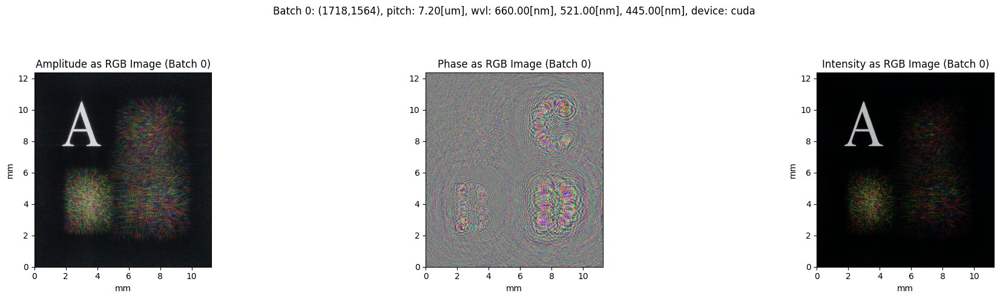

Letter B at z=0.6m, PSNR: 22.32 dB


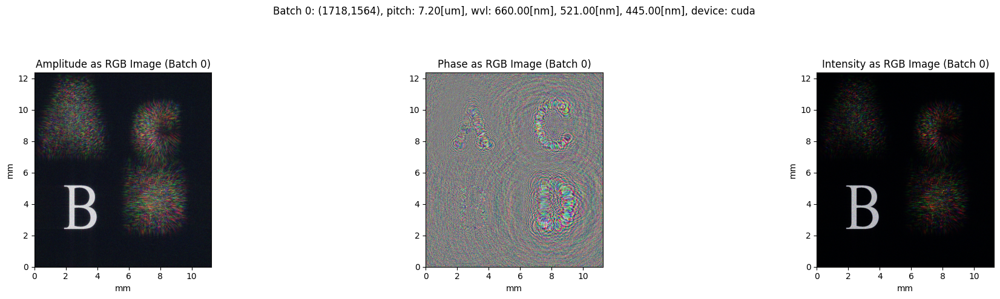

Letter C at z=0.7000000000000001m, PSNR: 22.75 dB


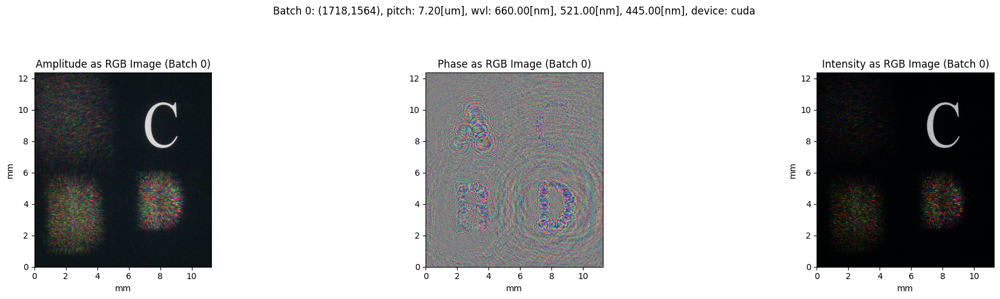

Letter D at z=0.8m, PSNR: 24.54 dB


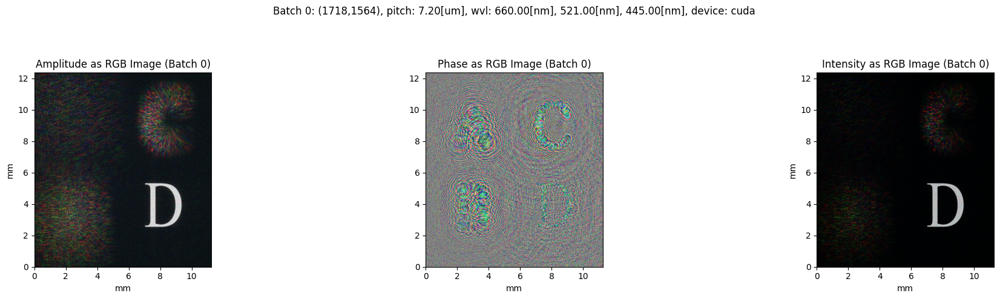


Optimized CGH pattern (Complex amplitude reconstruction):


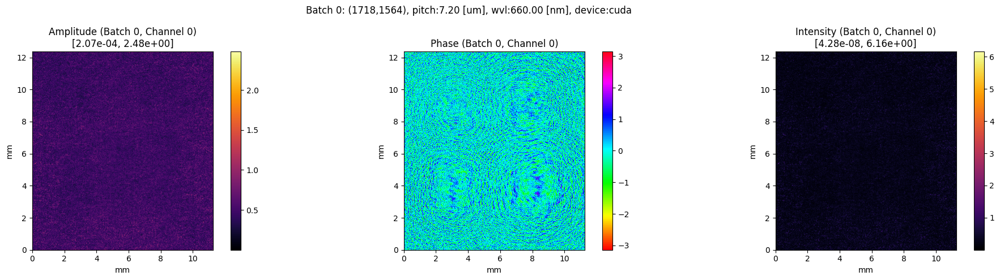

In [10]:
print("\nReconstruction Results (Complex amplitude reconstruction):")
for z, target, letter in zip(distances, target_lights, ['A', 'B', 'C', 'D']):
    recon_field = prop.forward(optimized_field, z=-z, band_limit=True)
    psnr = calculate_psnr(recon_field.get_intensity(), target.get_intensity())
    print(f"Letter {letter} at z={z}m, PSNR: {psnr:.2f} dB")
    recon_field.visualize_image()

# Visualize the optimized CGH pattern
print("\nOptimized CGH pattern (Complex amplitude reconstruction):")
optimized_field.visualize(c=0)